# Install packages

In [ ]:
#!pip install object-detection-fastai
#!pip install EXCAT-Sync
#!apt-get install python3-openslide
#!pip install gdown

# Handle imports

In [1]:
import torch
import torchvision.transforms as transforms
import openslide
import torchvision
import fastai

In [2]:
from fastai.vision.learner import create_body 

In [3]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric
from object_detection_fastai.helper.nms_center_distance import non_max_suppression_by_distance

In [4]:
from exact_sync.v1.api.annotations_api import AnnotationsApi
from exact_sync.v1.api.images_api import ImagesApi
from exact_sync.v1.api.image_sets_api import ImageSetsApi
from exact_sync.v1.api.annotation_types_api import AnnotationTypesApi
from exact_sync.v1.api.products_api import ProductsApi
from exact_sync.v1.api.teams_api import TeamsApi

from exact_sync.v1.models import ImageSet, Team, Product, AnnotationType, Annotation, AnnotationMediaFile
from exact_sync.v1.rest import ApiException
from exact_sync.v1.configuration import Configuration
from exact_sync.v1.api_client import ApiClient

# Connect to EXACT via the REST-API

In [5]:
from pathlib import Path

configuration = Configuration()
configuration.username = 'exact'
configuration.password = 'exact'
configuration.host = "http://localhost:1337"

client = ApiClient(configuration)

image_sets_api = ImageSetsApi(client)
annotations_api = AnnotationsApi(client)
annotation_types_api = AnnotationTypesApi(client)
images_api = ImagesApi(client)
product_api = ProductsApi(client)

In [6]:
# Model
!gdown --id  1npCXEgUDr6hzWwryZ1ctKspLk484kGT_

Downloading...
From: https://drive.google.com/uc?id=1npCXEgUDr6hzWwryZ1ctKspLk484kGT_
To: D:\ProgProjekte\Python\Exact\doc\Asthma-L0.p

0.00B [00:00, ?B/s]
11.0MB [00:00, 105MB/s]
22.5MB [00:00, 108MB/s]
35.1MB [00:00, 111MB/s]
47.2MB [00:00, 113MB/s]
52.9MB [00:00, 115MB/s]


### [Image](http://localhost:1337/annotations/5/?xmin=14043&ymin=14150&xmax=15377&ymax=14946)

In [7]:
image_id = 5
file_name = "BAL cent blue Luft 2.svs"
images_api.download_image(id=image_id, target_path=file_name)

(200, 'BAL cent blue Luft 2.svs')

## Some object detection inference code

In [8]:
model_file = "Asthma-L0.p"

device = torch.device("cpu")
model_information = torch.load(model_file, map_location='cpu') \
                    if torch.cuda.is_available() ==  False \
                    else torch.load(model_file)

model_weights = model_information['model']
anchors = model_information["anchors"]
mean = model_information["mean"]
std = model_information["std"]
shape = model_information["size"]
n_classes = model_information['n_classes']
n_anchors = model_information['n_anchors']
sizes = model_information['sizes']
chs = model_information['chs']
encoder = model_information['encoder']
n_conv = model_information['n_conv']
level = model_information['level']


encoder = create_body(models.resnet18, False, -2)

model = RetinaNet(encoder, n_classes, n_anchors=n_anchors, sizes=sizes,
                                       chs=chs, n_conv=2)
model.load_state_dict(model_weights)
model.to(device)
print("Done")

Done


## Load slide

In [9]:
slide = openslide.OpenSlide(filename=file_name)
slide.level_dimensions

((30599, 30442), (7649, 7610), (1912, 1902))

### grap a small patch at x=10000; y=10000 on level 0 with the size 2048x2048

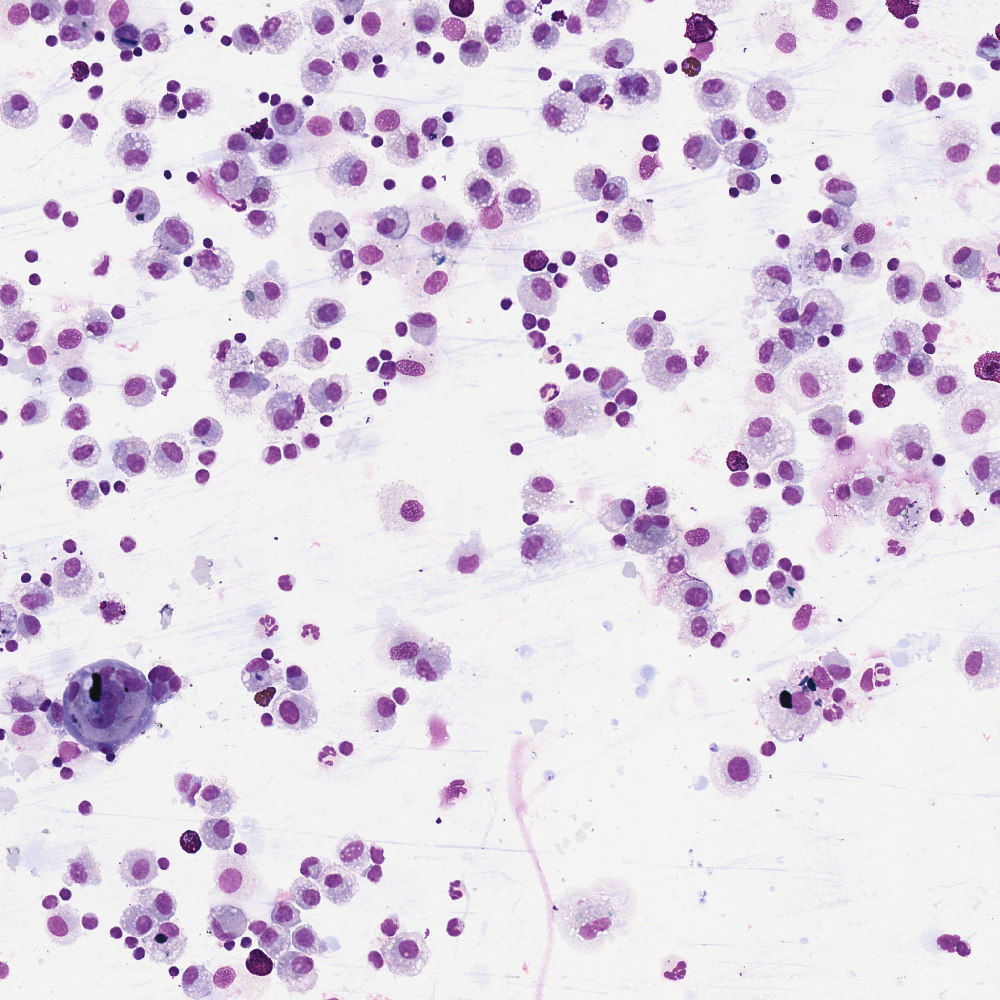

In [10]:
image = slide.read_region(location=(24001, 21596), level=level, size=(2048, 2048))
image

### Perform inference

In [11]:
def rescale_box(bboxes, size: Tensor):
    bboxes[:, :2] = bboxes[:, :2] - bboxes[:, 2:] / 2
    bboxes[:, :2] = (bboxes[:, :2] + 1) * size / 2
    bboxes[:, 2:] = bboxes[:, 2:] * size / 2
    bboxes = bboxes.long()
    return bboxes

In [12]:
detect_thresh = 0.5

image_results = {}
for id, image in enumerate([image]):
    results = []

    image = np.array(image)[:, :, :3]

    patches = []
    x_coordinates = []
    y_coordinates = []
    class_pred_batch, bbox_pred_batch = [], []

    for x in range(0, image.shape[1], shape):
        for y in range(0, image.shape[0], shape):

            patch = image[y:y+shape, x:x+shape]
            patch = pil2tensor(patch / 255., np.float32)
            patch = transforms.Normalize(mean, std)(patch)

            patches.append(patch[None, :, :, :])
            x_coordinates.append(x)
            y_coordinates.append(y)

    class_pred, bbox_pred, _ = model(torch.cat(patches).to(device))
    class_pred_batch.extend (class_pred)
    bbox_pred_batch.extend(bbox_pred)

    for clas_pred, bbox_pred, x, y in zip(class_pred_batch, bbox_pred_batch, x_coordinates, y_coordinates):

        bbox_pred, scores, preds = process_output(clas_pred.cpu(), bbox_pred.cpu(), anchors, detect_thresh=detect_thresh)
        
        if bbox_pred is not None:
            
            to_keep = nms(bbox_pred, scores, 0.9)
            
            bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()

            t_sz = torch.Tensor([shape, shape])[None].float()
            bbox_pred = rescale_box(bbox_pred, t_sz)

            for box, pred, score in zip(bbox_pred, preds, scores):

                y_box, x_box = box[:2]
                h, w = box[2:4]

                x1 = int(x_box) + x
                y1 = int(y_box) + y
                x2 = x1 + int(w)
                y2 = y1 + int(h)

                results.append([x1, y1, x2, y2, int(pred), float(score)])

    results = np.array(results)
    results = non_max_suppression_by_distance(results, results[:, 5], radius=30)

    if id == 0:
        image_results[file_name] = {"image": image, "results": results} 


d:\anaconda3\envs\eiph_wsi\lib\site-packages\object_detection_fastai\helper\object_detection_helper.py:157: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  ..\torch\csrc\utils\python_arg_parser.cpp:766.)
  if len(mask_keep.nonzero()) == 0: break


### take a look at the results

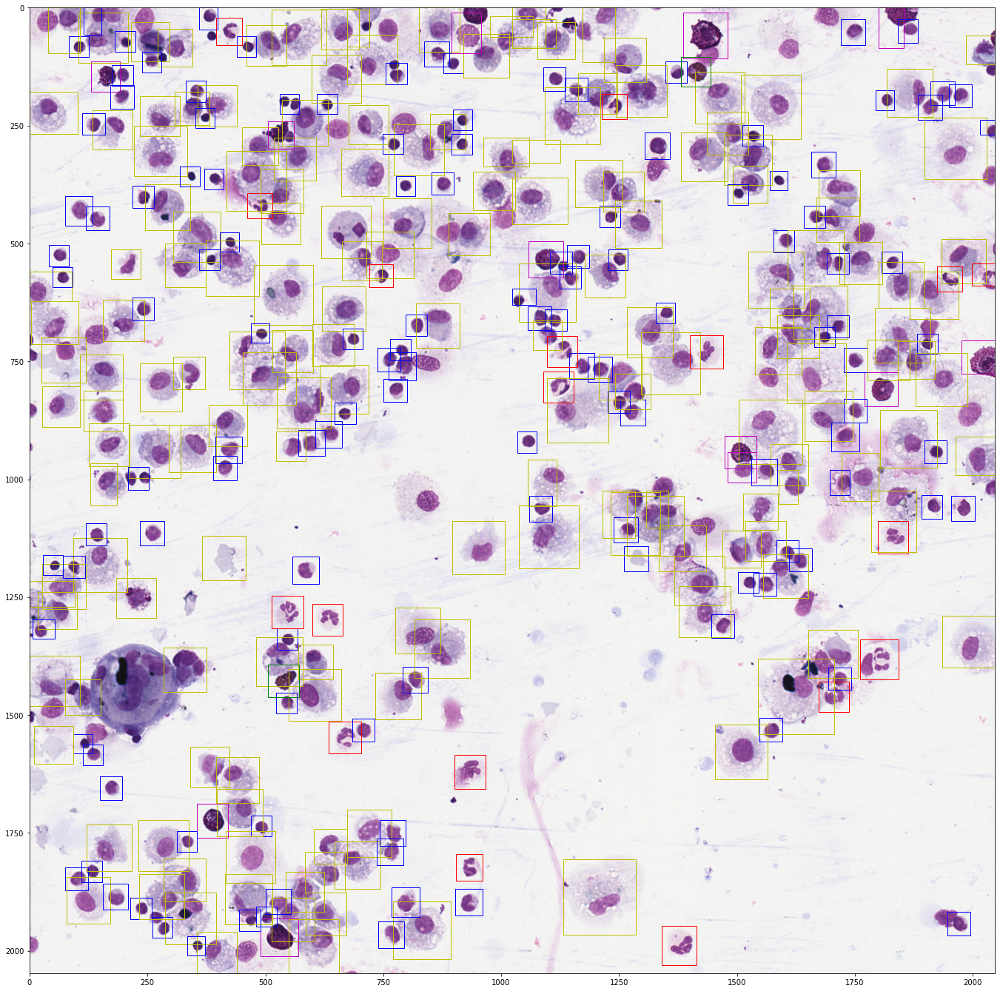

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

for image_name in image_results:
    image = image_results[image_name]["image"]
    results = image_results[image_name]["results"]

    f = plt.figure(figsize=(24,24))
    ax = f.subplots(1)

    ax.imshow(image)

    for x1, y1, x2, y2, pred, score in results:
        if score < .45:
            continue

        color = 'r' # Neutrophile
        if int(pred) == 0: # Eosinophile
            color = 'g'
        elif int(pred) == 1: # Lymohozyten
            color = 'b'
        elif int(pred) == 2: # Makrophagen
            color = 'y'
        elif int(pred) == 3: # Mastzellen
            color = 'm'

        rect = patches.Rectangle((x1, y1),y2-y1, x2-x1,linewidth=1,edgecolor=color,facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()